Part2： Single seed mask acquisition and segmentation


In [1]:
'''Import relevant libraries'''
import sys
from skimage import io,color,measure,morphology,filters,draw,segmentation,exposure,feature,draw
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np 
from scipy import ndimage as ndi
import peakdetect as pk
import matplotlib.patches as mpatches
import time 
import matplotlib.pyplot as plt
import tqdm
import random 
import random
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, NuSVC, LinearSVC
from sklearn import metrics 
from xgboost import XGBClassifier
import os
  



In [7]:
# //Function1 folders creating
def file_operate():
    '''File save address'''
    try:
        BASE_DIR=os.getcwd()
        
        # Location for image reading
        IMAGE_PATH= os.path.join(BASE_DIR,"IMAGE")  
        MASK_PATH= os.path.join(BASE_DIR,"MASK") 
        # Location for saving images
        if os.path.exists(IMAGE_PATH):
            print("IMAGE_PATH file already exist")
        if os.path.exists(MASK_PATH):
            print("MASK_PATH file already exist")
        else:
            os.mkdir(IMAGE_PATH)
            os.mkdir(MASK_PATH)
            print("begain..............")
        return MASK_PATH,IMAGE_PATH
    except :
        print("There is indentation issue")
if __name__ == "__main__":
    MASK_PATH,IMAGE_PATH = file_operate()

MASK_PATH file already exist


In [8]:
# //Fuction2  Image display
def Show_Image(image, type="", label_list=""):
    '''Display image function'''
    if type == "rgb": #// RGB three channel image
        fig=plt.figure(figsize=(20,20),dpi=600)
        plt.imshow(image)
   
    elif type == "gray": # // Single channel grayscale image
        fig=plt.figure(figsize=(20,20),dpi=600)
        plt.imshow(image,cmap="gray")
    elif type == "mask": # // binary image
        fig=plt.figure(figsize=(20,20),dpi=600)
        plt.imshow(image)
    elif type == "color" :  # // Pseudo color image
        fig=plt.figure(figsize=(20,20),dpi=600)
        plt.imshow(image,cmap=plt.cm.nipy_spectral)
    elif type == "two":  # // Single canvas dual image
        fig, axes=plt.subplots(2,1,figsize=(20,2),dpi=600)
        axes[0].imshow(image[0])
        axes[0].axis('off')
        axes[1].imshow(image[1])
        axes[1].axis('off')
    elif type =="boxes": # // Regional annotation image - Pseudo color image
        fig, ax = plt.subplots(figsize=(15,5),dpi=1000)
        ax.imshow(image)
        NUM = 0
        # FONT = cv2.FONT_HERSHEY_SIMPLEX
        # FONT_SIZE =1
        # FONT_THICKNESS =2
        
        for region in (label_list):
            minr, minc, maxr, maxc = region.bbox
            NUM=NUM+1
            # draw rectangle around segmented seed
            rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                fill=False, edgecolor='red', linewidth=1)
        
            plt.text(region.centroid[1],region.centroid[0], NUM, ha='center', va= 'bottom', fontsize=5, color='white')
            ax.add_patch(rect)
        ax.set_axis_off()
        plt.tight_layout()
        plt.show()
if __name__ =="__main__":
    pass

In [9]:
# //Function3 Image flipping operation
def Flip_Image(path):
    '''Image flipping operation'''
    BACK_IMAGE=io.imread(path)
    IMAGE_FLIP =cv.flip( BACK_IMAGE,1)
    return  IMAGE_FLIP
if __name__ == "__main__": 
    pass

In [10]:
#  //Function 4 Image grayscale transformation and calculation of grayscale histogram
# Input grayscale or single-channel image
def find_peaks(image):
    '''Finding a turning point'''
    [peaks, _] = pk.peakdetect(np.array(image), lookahead=5)
    indices = []
    values = []
    for peak in peaks:
        indices.append(peak[0])
        values.append(peak[1])
    return np.array(indices), np.array(values)  
 
def Plotting_histograms(image):
    '''Gray scale histogram plotting'''
    hist, hist_centers = exposure.histogram(image)
    peaks=find_peaks(hist)[1]
    index=[hist.tolist().index(i) for i in (peaks)]
    index=[hist_centers.tolist()[i] for i in (index)]
    fig, axes = plt.subplots(2, 1, figsize=(10, 5),dpi=600)
    axes[0].imshow(image, cmap=plt.cm.gray)
    axes[0].axis('off')
    axes[1].plot(hist_centers, hist, lw=2)
    axes[1].scatter(index,peaks,c="r")
    for i in range(len(index)):
        axes[1].text(index[i],peaks[i],(index[i],peaks[i]),fontsize=5)
    axes[1].set_title('histogram of gray values')

if __name__ =="__main__": 
    pass
    # Plotting_histograms(BACK_IMAGE_L_CHANNEL)
    

In [11]:
# # //Function5  Obtaining binary images based on machine learning
#Building a machine learning model, only two types of segmentation will be done here
def machine_learning (IMAGE,COORD_TOTAL):
    '''Using machine learning to obtain image masks'''
   # Choose whether LAB color is required. 
   # If the computer's memory and computing power are not large, it is not recommended to add LAB color
    NEED_LAB=False
   #   Do you want to set all backgrounds to 0
    BACK_CLASS =False
   # There that we choose SVM model ，because SVM performs well in image pixel classification 
    img=IMAGE.copy() #//Images that need to be processed
    # Category 1 type of RGB/LAB color channel value background class -1 is the background
    img_lab=color.rgb2lab(IMAGE)
    # Extract the coordinates of the background categories and convert them to list form  
    x=[list(i) for i in (list(list(zip(COORD_TOTAL[0][0],COORD_TOTAL[0][1]))))]
    x_coord=[i for i in (x)] 
    # Extract the RGB/LAB color channel values for the background category based on the value of BACK_CLASS
    if BACK_CLASS ==True:
        x_image_rgb=[[0,0,0] for i in (x_coord)]
        x_image_lab=[ [0,0,0] for i in (x_coord)]
    if BACK_CLASS ==False:
        x_image_rgb=[ img[i[1],i[0]] for i in (x_coord)]
        x_image_lab=[ img_lab[i[1],i[0]] for i in (x_coord)]
    # Category 2 RGB/LAB color channel value foreground category -2 foreground categories
    # Extract coordinates and RGB/LAB color channel values for foreground category
    y=[list(i) for i in (list(list(zip(COORD_TOTAL[1][0],COORD_TOTAL[1][1]))))]
    y_coord=[i for i in (y)]
    y_image_rgb=[ img[i[1],i[0]] for i in (y_coord)]
    y_image_lab=[ img[i[1],i[0]] for i in (y_coord)]
    # Merge RGB and LAB color channel values based on NEED_LAB value 
    # (if NEED_LAB is True, the LAB channel is overwritten by error) 
    if NEED_LAB ==True:
        CHANNELS_ARR = np.concatenate((x_image_rgb,y_image_rgb),axis=0) 
        CHANNELS_ARR = np.concatenate((x_image_lab,y_image_lab),axis=0) 
        CHANNELS_ARR = np.concatenate(( CHANNELS_ARR, CHANNELS_ARR),axis=1) 
    if NEED_LAB ==False:
        CHANNELS_ARR = np.concatenate((x_image_rgb,y_image_rgb),axis=0) 
    print(CHANNELS_ARR.shape)
    if NEED_LAB ==False:
        # Create labels for background and foreground  
        label_1=np.zeros(np.array(x).shape[0])
        label_2=np.ones(np.array(y).shape[0])
    if NEED_LAB ==True:
        label_1=np.zeros(np.array(x).shape[0])
        label_2=np.ones(np.array(y).shape[0])
    if NEED_LAB == True:
        # Merge RGB and LAB images 
        # (if NEED_LAB is True, this step is incorrect because the CHANNELS_ARR processing above is incorrect)  
        image_reshape=np.concatenate([img.reshape([img.shape[0]*img.shape[1],img.shape[2]]),
                        img_lab.reshape([img.shape[0]*img.shape[1],img.shape[2]])],axis=1)
    if NEED_LAB == False:
        image_reshape=img.reshape([img.shape[0]*img.shape[1],img.shape[2]])   
    # Create an array of tags  
    label=np.concatenate((label_1,label_2),axis=0)
    # print(label.shape)
    # Train the SVM model 
    SVM=SVC(kernel='poly',degree=3) #// Support vector machine
    SVM.fit( CHANNELS_ARR,label)
    # Predictions using trained models  
    predict =SVM.predict(image_reshape)
    # Reshape the prediction into the shape of the original image
    predict=predict.reshape([img.shape[0],img.shape[1]])
    return  predict
def mask_post_processing(IMAGE,COORD_TOTAL):
    PREDICT_IMAGE=machine_learning (IMAGE,COORD_TOTAL)
    # Morphological closure operations on predicted images to fill small holes
    MASK_ORIGINAL=morphology.closing( PREDICT_IMAGE.copy(),morphology.disk(1))
    # Perform morphological open operations on images after closed operations to remove small isolated points
    image=morphology.opening( MASK_ORIGINAL.copy(),morphology.disk(1))
    # Remove objects smaller than the specified size 
    image=morphology.remove_small_objects(image.astype(np.bool8),500)
    # Remove small holes and set small hole area to 1 (non-masked area) and other areas to 0 (masked area)
    SEED_MASK=np.where(morphology.remove_small_holes(image.astype(np.bool8),100)>0,0,1)
    io.imsave(os.path.join( MASK_PATH,"SEED_MASK_ORIGINAL.png"),SEED_MASK)#//Save preliminary image mask
    return SEED_MASK
    # color_image=color.label2rgb(measure.label(SEED_MASK),bg_label=0)
    # MARK_IMAGE=mark_boundaries(BACK_IMAGE_CA_FLIP,measure.label(SEED_MASK))
    # io.imsave(os.path.join( MASK_PATH,"MARK_IMAGE.png"),MARK_IMAGE)
    # show_image(color_image,type="rgb") 

if __name__ == "__main__":
    #I have chosen the support vector machine model here, which has shown good performance in binary classification\
    pass
   

In [13]:
# # //Function6 Watershed segmentation algorithm
def watershed(image,get_total_image_color=""):
    '''Using watershed algorithm to segment images'''
    #Calculate the distance from each pixel in the image to the nearest background pixel using Euclidean distance transformation
    distance = ndi.distance_transform_edt(image)
    #Find local maximum values in the distance transformed image, which will serve as marker points for the watershed algorithm
    local_max_coords = feature.peak_local_max(distance, min_distance=25)
    #Create a Boolean array with the same shape as the distance transformation image to store the positions of marker points
    local_max_mask = np.zeros(distance.shape, dtype=bool)
    #Set the position of the marker point to True
    local_max_mask[tuple(local_max_coords.T)] = True
    #Mark the marked points and generate a marked image, where each marked point has a unique label
    markers = measure.label(local_max_mask)
    #Use watershed algorithm to segment the image and return the segmented label image
    segmented_cells = segmentation.watershed(-distance, markers, mask=image)
    #Determine which form of segmentation result to return based on the value of the get_totant_image_color parameter
    if get_total_image_color == True:
        #Convert the segmented label image into a color image and add labels to each region
        color_image=color.label2rgb(segmented_cells, bg_label=0)
        COLOR_IMAGE=color_image.copy()
        font=cv.FONT_HERSHEY_SIMPLEX
        font_size=1
        font_thickness=2
        label_list=measure.regionprops(segmented_cells)
        for i,region in enumerate(label_list):
            #Add labels to each region, with the label text being the region's serial number
            text=str(i+1)
            minr, minc, maxr, maxc = region.bbox
            color_image=cv.putText(COLOR_IMAGE, text, (int(region.centroid[1]),int(region.centroid[0])), font, font_size, (0, 0, 0), font_thickness)
            seg_image=np.logical_or(COLOR_IMAGE,color_image)
    if get_total_image_color == False:
        #Use the mark_foundaries function to mark segmentation boundaries on the original image
        edge=segmentation.mark_boundaries(image,segmented_cells)
        #Create a completely black image with the same shape as the original image, but only retain the positions 
        #  of non-zero pixels in the original image as white (the logic seems to be incorrect here, as this image was not ultimately used)
        image_merge=cv.merge([np.where(image>0,255,0),np.where(image>0,255,0),np.where(image>0,255,0)])
        edge = np.logical_xor(edge,image_merge)
        seg_image = np.where(color.rgb2gray(edge)>0,0,1)*image
    #Return the segmented image
    return seg_image
    
if __name__ == "__main__":
    pass
    

In [14]:
# # //Function7  Finally, calculate the area of each label, take the area of two or three seeds, 
# and calculate the convex hull to obtain convex defects. The graph defects are used to segment the remaining seeds

def Convex_defects(image):
    '''Obtain convex defects'''
    #Label the image and assign a unique label to each connected region
    label_image=measure.label(image)
    #Calculate the area of each connected region
    area=[]
    for region in (measure.regionprops(label_image)):
        area.append(region.area)
    #Remove small objects smaller than 1.25 times the median area
    image_remove_smallbold=morphology.remove_small_objects(image.astype(np.bool8),int(np.median(area))*1.25)
    #Calculate the convex hull of each object
    image_convex=morphology.convex_hull_object(image_remove_smallbold, connectivity=1)
    #Calculate the convex defect area (i.e. the part outside the convex hull)
    image_convexity=np.logical_xor( image_remove_smallbold,image_convex)
    #Remove small convex defect areas smaller than 500 pixels
    image_convexity=morphology.remove_small_objects(image_convexity.astype(np.bool8),500)
    #Perform an open operation on the convex defect area to remove small noise points
    image_convexity=morphology.opening(image_convexity,morphology.disk(1))
    return image_convexity,image_convex,image_remove_smallbold

def get_min_point(contour1,contour2):
    #Using Harris corner detection algorithm to detect the corners of two contours
    coords11=feature.corner_peaks(feature.corner_harris(contour1), min_distance=5,threshold_rel=0.02)
    coords22=feature.corner_peaks(feature.corner_harris(contour2),min_distance=5,threshold_rel=0.02)
    min_distance=sys.maxsize
    #Calculate the minimum distance between two contour corner points
    for i in range(len(coords11)):
        for j in range (len(coords22)):
            distance=pow(((coords11[i][0]-coords22[j][0])**2+(coords11[i][1]-coords22[j][1])**2),0.5)
            if (distance<min_distance):
                min_distance=distance
                index111=i
                index222=j
    return  coords11[index111], coords22[index222]

def contour(label,number):
    '''Extract corresponding contour regions based on tag values'''
    contour=np.where(label==number+1,1,0)
    return contour
def Contour_index(image):
    ''''Obtain the nearest point coordinates and index of each convex defect corner point'''
    #Label the image and obtain the attributes of each connected region
    # image=morphology.remove_small_objects(image.astype(np.bool8),70)
    label=measure.label(image)
    label_list=measure.regionprops(label)
    #Initialize coordinate list
#     min_distance=sys.maxsize
    coord_list_x=[]
    coord_list_y=[]
    #Traverse each connected region and calculate the nearest corner distance to other regions
    for index_x,region in enumerate (label_list.copy()):
        # min_distance=sys.maxsize
        contour1=contour(label,index_x)
        Distance=[]
        left_coord=[]
        right_coord=[]
        for index_y,regions in enumerate(label_list.copy()):
          
            #Get the closest corner points of two contours
            contour2=contour(label,index_y)
            # coords_x, coords_y,index_1,index_2 =get_min_point(contour1,contour2)
            # distance=pow(((coords_x[0]-coords_y[0])**2+(coords_x[1]-coords_y[1])**2),0.5)
            if np.sum(contour1-contour2)==0:
                continue    
            else:
                coords11=feature.corner_peaks(feature.corner_harris(contour1), min_distance=5,threshold_rel=0.02)
                coords22=feature.corner_peaks(feature.corner_harris(contour2),min_distance=5,threshold_rel=0.02)
                min_distance_region=sys.maxsize
                for i in range(len(coords11)):
                    for j in range (len(coords22)):
                        distance=pow(((coords11[i][0]-coords22[j][0])**2+(coords11[i][1]-coords22[j][1])**2),0.5)
                        if (distance<min_distance_region):
                            min_distance_region=distance
                            index111=i
                            index222=j
                # print(coords11[index111])
                left_coord.append(coords11[index111])
                right_coord.append(coords22[index222])
        for i,j in enumerate( left_coord):
            Distance.append(pow((( right_coord[i][0]-left_coord[i][0])**2+( right_coord[i][1]-left_coord[i][1])**2),0.5))
        # print(Distance)
        if Distance == []:
            continue
        index=Distance.index(min(Distance))
        coord_x=left_coord[index]
        coord_y=right_coord[index]
        coord_list_x.append(coord_x)
        coord_list_y.append(coord_y)
        #Calculate and store the nearest distance
        # ... (Omitted some code)
    return coord_list_x,coord_list_y
#  Note that if there are too many convex defect areas, in order to reduce the time complexity of the algorithm,
#  the nearest corner points can be calculated sequentially for each convex hull area
def Contour_index_single(image_convexity,image_convex):
    '''Label the convex hull image and obtain the attributes of each connected region
      Calculate the nearest corner point between each convex hull region and the convex defect region'''
    label=measure.label(image_convex)
    label_list=measure.regionprops(label)
    X=[]
    Y=[]
    for i,j in enumerate(label_list):

        #Single convex hull region
        Singer_convex=contour(label,i)
        Contour=np.logical_and(Singer_convex,image_convexity)
        # plt.imshow(Contour)
        left_coord,right_coord=Contour_index(Contour)
        # print(left_coord)
        X.append(left_coord)
        Y.append(right_coord)
    return sum(X,[]),sum(Y,[]) 
def seg_images(left_coord,right_coord,MASK):
    '''Obtain the segmented image, where the parameters are 
    the set of corner coordinates of the nearest convex defect area'''
    #Draw a segmentation line based on the coordinates of the nearest corner and segment the image
    #Post process the segmented image and remove small areas
    for i,j  in enumerate(right_coord):
        # print(right_coord[i])
        rr, cc,val = draw.line_aa(left_coord[i][0],left_coord[i][1],right_coord[i][0], right_coord[i][1])
        line_image=MASK
        line_image[rr, cc] =255
        seg_image=np.where(line_image==255,0,1)*MASK  
    label_image=measure.label(seg_image)
    area=[]
    for region in (measure.regionprops(label_image)):
        area.append(region.area)
    seg_image_1=morphology.remove_small_objects(seg_image.astype(np.bool8),int(np.median(area))*0.1)   
    seg_image_2=morphology.remove_small_objects(seg_image.astype(np.bool8),int(np.median(area))*1.5) 
    seg_image=np.logical_xor(seg_image_1,seg_image_2)  
    # show_image(seg_image)
    return seg_image
if __name__ == "__main__": 
    pass
    
        

In [24]:
# # //Function8  Obtain MASK images of the final seed labels for each variety and save them separately
def seed_singer_mask( PREDICT_IMAGE):
    Convex="False"
    #Define the paths for the TAPE mask directory and SEED raw mask directory
    TAPE_SINGER_MASK_DIR=os.path.join(MASK_PATH,"TAPE_MASK")
    #Check if the SEED raw mask directory exists, if not, create it
    SEED_SINGER_MASK_DIR=os.path.join(MASK_PATH,"SEED_MASK")
    if os.path.exists(SEED_SINGER_MASK_DIR) == False:
        os.mkdir(SEED_SINGER_MASK_DIR)
    else :
        print("The folder already exists")
    #Traverse all files in the TAPE mask directory
    for i in tqdm.tqdm(range(len(os.listdir(TAPE_SINGER_MASK_DIR)))):
        #Read the current TAPE mask image
        TAPE_MASK=io.imread(os.path.join(TAPE_SINGER_MASK_DIR,f"{i+1}.png"))
        #Using logic and operations combined with TAPE masks and predicted images to generate SEED masks
        SEED_MASK = np.logical_and(TAPE_MASK, PREDICT_IMAGE)
        #Convert non-zero values in SEED mask to 1 and keep zero values at 0
        SEED_MASK = np.where(SEED_MASK.copy()>0,1,0)
        #Initialize a flag variable to control whether to obtain the total color of the image (not used in the code here)
        get_total_image_color = False
        SEED_MASK= watershed(SEED_MASK,get_total_image_color)
        #Call the Convex_defects function to process the SEED mask and obtain the processed image and its related information

        if Convex == "True":
            image_convexity,image_convex,image_remove_smallbold=Convex_defects(SEED_MASK)
            #Call the Contour_index_stngle function to obtain the contour index of the image
            left_coord,right_coord=Contour_index_single(image_convexity,image_convex)
            if left_coord != []:
                #If there are left contour coordinates, further process and save the SEED mask
                SEED_MASK=seg_images(left_coord,right_coord,SEED_MASK)
                io.imsave(os.path.join(SEED_SINGER_MASK_DIR,f"{i+1}.png")   , SEED_MASK)   
            else: 
                #If there are no left contour coordinates, save the current SEED mask directly
                io.imsave(os.path.join(SEED_SINGER_MASK_DIR,f"{i+1}.png")   , SEED_MASK)   
        else:
            io.imsave(os.path.join(SEED_SINGER_MASK_DIR,f"{i+1}.png")   , SEED_MASK)
if __name__ == "__main__":
    pass
       

In [25]:
########################################################################
##                 <Algorithm running main program>                   ##                                                
########################################################################

if __name__ == "__main__":
    try:
        ## ##############/////Step 1 : Obtain the mask for the seed area
        CA_IMAGE_PATH = os.path.join(
            os.path.join(os.path.dirname(os.getcwd()),os.listdir(os.path.dirname(os.getcwd()))[0]),\
            os.listdir( os.path.join(os.path.dirname(os.getcwd()),os.listdir(os.path.dirname(os.getcwd()))[0]))[1]) 
        MASK_IMAGE_PATH = os.path.join(
            os.path.join(os.path.dirname(os.getcwd()),os.listdir(os.path.dirname(os.getcwd()))[0]),\
            os.listdir( os.path.join(os.path.dirname(os.getcwd()),os.listdir(os.path.dirname(os.getcwd()))[0]))[2])
        CA_IMAGE_FLIP = Flip_Image( CA_IMAGE_PATH)[:,:,0:3]## \\ Read the image after conversion to regular status

        COLORS = [[244, 67, 54], [233, 30, 99], [156, 39, 176], [103, 58, 183], 
                                            [100, 30, 60], [63, 81, 181], [33, 150, 243], [3, 169, 244], [0, 188, 212], 
                                            [20, 55, 200], [0, 150, 136], [76, 175, 80], [139, 195, 74], [205, 220, 57], 
                                            [70, 25, 100], [255, 235, 59], [255, 193, 7], [255, 152, 0], [255, 87, 34], 
                                            [90, 155, 50], [121, 85, 72], [158, 158, 158], [96, 125, 139], [15, 67, 34], 
                                            [98, 55, 20], [21, 82, 172], [58, 128, 255], [196, 125, 39], [75, 27, 134], 
                                            [90, 125, 120], [121, 82, 7], [158, 58, 8], [96, 25, 9], [115, 7, 234], 
                                            [8, 155, 220], [221, 25, 72], [188, 58, 158], [56, 175, 19], [215, 67, 64], 
                                            [198, 75, 20], [62, 185, 22], [108, 70, 58], [160, 225, 39], [95, 60, 144], 
                                            [78, 155, 120], [101, 25, 142], [48, 198, 28], [96, 225, 200], [150, 167, 134], 
                                            [18, 185, 90], [21, 145, 172], [98, 68, 78], [196, 105, 19], [215, 67, 84], 
                                            [130, 115, 170], [255, 0, 255], [255, 255, 0], [196, 185, 10], [95, 167, 234], 
                                            [18, 25, 190], [0, 255, 255], [255, 0, 0], [0, 255, 0], [0, 0, 255], 
                                            [155, 0, 0], [0, 155, 0], [0, 0, 155], [46, 22, 130], [255, 0, 155], 
                                            [155, 0, 255], [255, 155, 0], [155, 255, 0], [0, 155, 255], [0, 255, 155], 
                                            [18, 5, 40], [120, 120, 255], [255, 58, 30], [60, 45, 60], [75, 27, 244], [128, 25, 70]]
        COORD_TOTAL=[]
        IMAGE_LINE_MASK_TOTAL=[]
        fill= False
        num=1
        IMAGE_RGB=True
        IMAGE_LAB =True
        img=CA_IMAGE_FLIP.copy()[:,:,::-1]
        while True:
            COLOR=COLORS[random.randint(0, 79)]
            CoordinateX = []  # // The set of X coordinates for the selected point
            CoordinateY = []  # //The set of Y coordinates for the selected point
            COORD=[]
            IMAGE_LINE_MASK_LAST = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
            #// Mouse events
            def mouse(event, x, y, flags, param):
                global flag, horizontal, vertical, flag_hor, flag_ver, dx, dy, sx, sy, dst, x1, y1, x2, y2, x3, y3, f1, f2
                global zoom, scroll_har, scroll_var, img_w, img_h, img, dst1, win_w, win_h, show_w, show_h, CoordinateX, CoordinateY
                if event == cv.EVENT_LBUTTONDOWN:  # // left click
                    if flag == 0:
                        if horizontal and 0 < x < win_w and win_h - scroll_w < y < win_h:
                            flag_hor = 1  #// Mouse on horizontal scrollbar
                        elif vertical and win_w - scroll_w < x < win_w and 0 < y < win_h:
                            flag_ver = 1  # Mouse on the vertical scrollbar
                        else:  #//Mouse over image
                            truex = x + dx
                            truey = y + dy
                            truexy = "%d,%d" % (truex, truey)
                            CoordinateX.append(truex)
                            CoordinateY.append(truey)
                          
                            img1 = img[dy:dy + show_h, dx:dx + show_w]  # //Capture display image
                            cv.circle(img1[:,:,::-1], (int(x), int(y)), 2, COLOR, thickness=-1)
                            if len( CoordinateX) >=2:
        #                         cv2.line(img1,(CoordinateX[-2]-dx,CoordinateY[-2]-dy), (x, y), color, 3)
                                # rr, cc, val = line_aa(CoordinateX[-2]-dx,CoordinateY[-2]-dy, x, y)
                                rr, cc,val = draw.line_aa(CoordinateY[-2],CoordinateX[-2],  truey,  truex)
        #                         IMAGE_LINE_MASK[rr, cc] =val * 255
        #                         IMAGE_LINE_MASK_LAST[rr, cc] =val * 255
                                # io.imsave(os.path.join(IMAGE_PATH," IMAGE_LINE_MASK.png"), IMAGE_LINE_MASK)
                                # cv2.line( img, (a[-2]-c[-2],b[-2]-d[-2]), (x, y), (255, 255, 255), 10)
                            cv.putText(img1[:,:,::-1], str(num), (x, y), cv.FONT_HERSHEY_PLAIN,
                                        1.0, (255, 255, 255), thickness=1)
                            dst = img1.copy()
                        if flag_hor or flag_ver:
                            flag = 1  # //Make the scrollbar vertical
                            x1, y1, x2, y2, x3, y3 = x, y, dx, dy, sx, sy  # //Make the mouse movement distance relative to the initial scrollbar click position, 
                                                                            # rather than relative to the previous position
                elif event == cv.EVENT_MOUSEMOVE and (flags & cv.EVENT_FLAG_LBUTTON):  # Hold down the left button and drag
                    if flag == 1:
                        if flag_hor:
                            w = (x - x1)/2  # //Moving width
                            dx = x2 + w * f1  #// Original image x
                            if dx < 0:  #// Correction of placement
                                dx = 0
                            elif dx > img_w - show_w:
                                dx = img_w - show_w
                            sx = x3 + w  # //Scroll bar x
                            if sx < 0:  # //Position correction
                                sx = 0
                            elif sx > win_w - scroll_har:
                                sx = win_w - scroll_har
                        if flag_ver:
                            h = y - y1  # //Moving height
                            dy = y2 + h * f2  # //Original image y
                            if dy < 0:  # //Position correction
                                dy = 0
                            elif dy > img_h - show_h:
                                dy = img_h - show_h
                            sy = y3 + h  # //Scroll bar y
                            if sy < 0: # //Position correction
                                sy = 0
                            elif sy > win_h - scroll_var:
                                sy = win_h - scroll_var
                        dx, dy = int(dx), int(dy)
                        img1 = img[dy:dy + show_h, dx:dx + show_w]  #// Capture display image
                        dst = img1.copy()
                elif event == cv.EVENT_LBUTTONUP:  #// Left click release
                    flag, flag_hor, flag_ver = 0, 0, 0
                    x1, y1, x2, y2, x3, y3 = 0, 0, 0, 0, 0, 0

                if horizontal and vertical:
                    sx, sy = int(sx), int(sy)
                    # Draw on dst1 instead of dst to avoid constantly refreshing mouse events and filling the displayed image
                    dst1 = cv.copyMakeBorder(dst, 0, scroll_w, 0, scroll_w, cv.BORDER_CONSTANT, value=[255, 255, 255])
                    cv.rectangle(dst1, (sx, show_h), (int(sx + scroll_har), win_h), (181, 181, 181), -1)  # //Draw a horizontal scrollbar
                    cv.rectangle(dst1, (show_w, sy), (win_w, int(sy + scroll_var)), (181, 181, 181), -1)  # //Draw a vertical scrollbar
                elif horizontal == 0 and vertical:
                    sx, sy = int(sx), int(sy)
                    dst1 = cv.copyMakeBorder(dst, 0, 0, 0, scroll_w, cv.BORDER_CONSTANT, value=[255, 255, 255])
                    cv.rectangle(dst1, (show_w, sy), (win_w, int(sy + scroll_var)), (181, 181, 181), -1)  #// Draw a horizontal scrollbar
                elif horizontal and vertical == 0:
                    sx, sy = int(sx), int(sy)
                    dst1 = cv.copyMakeBorder(dst, 0, scroll_w, 0, 0, cv.BORDER_CONSTANT, value=[255, 255, 255])
                    cv.rectangle(dst1, (sx, show_h), (int(sx + scroll_har), win_h), (181, 181, 181), -1)  #  //Draw a vertical scrollbar
                cv.imshow("img", dst1)
                cv.waitKey(1)
        
            cv.namedWindow('img')
            img_h, img_w = img.shape[0:2]  # //Original image width and height
            # show_h, show_w = 600, 800  # //Display image width and height
            show_h, show_w = 900, 1600  # //Display image width and height
            horizontal, vertical = 0, 0  # //Does the original image exceed the displayed image
            dx, dy = 0, 0  # //Display the coordinates of the image relative to the original image
            scroll_w = 16  # //Scroll bar width
            sx, sy = 0, 0  # //The coordinates of the scroll block relative to the scrollbar
            flag, flag_hor, flag_ver = 0, 0, 0  # //Mouse operation type, whether the mouse is on the horizontal scrollbar or the vertical scrollbar
            x1, y1, x2, y2, x3, y3 = 0, 0, 0, 0, 0, 0  # //intermediate variable
            win_w, win_h = show_w + scroll_w, show_h + scroll_w  # //Window width and height
            scroll_har, scroll_var = win_w * show_w / img_w, win_h * show_h / img_h  # //Horizontal and vertical length of scrollbar
            wheel_step, zoom = 0.05, 1  # //Scaling factor, scaling value
            zoom_w, zoom_h = img_w, img_h  # //Zoom in on the width and height of the image
            f1, f2 = (img_w - show_w) / (win_w - scroll_har), (img_h - show_h) / (win_h - scroll_var)  # //The proportion of movable parts in the original image 
                                                                                                       #to the movable parts of the scrollbar
            if img_h <= show_h and img_w <= show_w:
                cv.imshow("img", img)
                cv.destroyAllWindows()
                print("1")
                sys.exit(0)
            else:
                if img_w > show_w:
                    horizontal = 1
                if img_h > show_h:
                    vertical = 1
                i = img[dy:dy + show_h, dx:dx + show_w]
                dst = i.copy()
            cv.resizeWindow("img", win_w, win_h)
            cv.setMouseCallback('img', mouse)
            k=cv.waitKey(0)
            if k == 13: 
                cv.destroyAllWindows()
                COORD=[CoordinateX,CoordinateY]
                ss=COORD
                COORD_TOTAL.append(COORD)
                num=num+1
                if fill == True:
                    # //Flood filling
                    filled_checkers = segmentation.flood_fill(IMAGE_LINE_MASK_LAST, (ss[0][0], ss[1][0]), 127)
                    IMAGE_LINE_MASK_fill=np.where(filled_checkers>0,0,1)
                    IMAGE_LINE_MASK_TOTAL.append(IMAGE_LINE_MASK_fill)
                    # //File save
                    io.imsave(os.path.join(IMAGE_PATH,f"IMAGE_LINE_MASK_{num}.png"), IMAGE_LINE_MASK_fill)
            elif k == ord('s'): # Save and output coordinate label when pressing the s key
                # cv2.imwrite(os.path.join(IMAGE_PATH,f'./IMAGE_LINE_MASK_{num}.png'), IMAGE_LINE_MASK)
                cv.destroyAllWindows()
                break      
            # print(COORD_TOTAL)
         

    except IOError :
        print("File not read, please re-enter")

    ## ##############/////Step 2 : Adhesive seed segmentation
    try: #// Machine learning prediction(SVM model)
        PREDICT_IMAGE = mask_post_processing(CA_IMAGE_FLIP,COORD_TOTAL) # 
        #//After obtaining the seed mask, we need to segment the seeds adhered to the large image mask
        seed_singer_mask(PREDICT_IMAGE)#// Keep every label
  
    
    except:
        print("The marked variable is empty, please re mark it")

print("Finished running, results have been saved to folder")
print(time.strftime('%Y-%m-%d %H:%M:%S',time.localtime(time.time()))) 



e:\Program files\condas\lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (158593721 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(146, 3)
(146,)


C:\Users\29209\AppData\Local\Temp\ipykernel_12828\3123563299.py:58: UserWarning: g:\project\同步辐射分析\文章代码\ipython\MASK\SEED_MASK_ORIGINAL.png is a low contrast image
  io.imsave(os.path.join( MASK_PATH,"SEED_MASK_ORIGINAL.png"),SEED_MASK)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


The folder already exists


  0%|          | 0/1163 [00:00<?, ?it/s]e:\Program files\condas\lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (158593721 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
C:\Users\29209\AppData\Local\Temp\ipykernel_12828\3281592694.py:37: UserWarning: g:\project\同步辐射分析\文章代码\ipython\MASK\SEED_MASK\1.png is a low contrast image
  io.imsave(os.path.join(SEED_SINGER_MASK_DIR,f"{i+1}.png")   , SEED_MASK)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
  0%|          | 1/1163 [00:31<10:15:26, 31.78s/it]C:\Users\29209\AppData\Local\Temp\ipykernel_12828\3281592694.py:37: UserWarning: g:\project\同步辐射分析\文章代码\ipython\MASK\SEED_MASK\2.png is a low contrast image
  io.imsave(os.path.join(SEED_SINGER_MASK_DIR,f"{i+1}.png")   , SEED_MASK)
Lossy conversion from int32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
  0

Finished running, results have been saved to folder
2024-10-17 22:43:30


In [ ]:
###################################################################
#                      END of the algorithm                       #
###################################################################

In [ ]:
###################################################################
#                   Image processing process                      #
###################################################################

  0%|                                                                                         | 0/1163 [00:00<?, ?it/s]E:\Program files\condas\lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (158593721 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████| 1163/1163 [11:51<00:00,  1.64it/s]
C:\Users\29209\AppData\Local\Temp\ipykernel_4656\3973875397.py:53: UserWarning: ./qees.png  is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  io.imsave("./qees.png ",TOTAL_MASK)


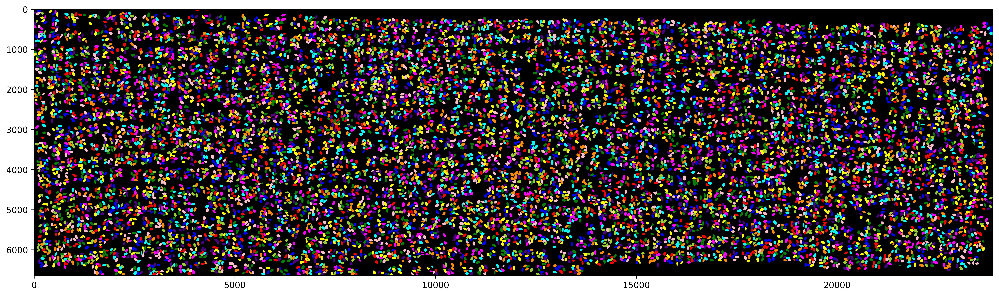

In [24]:
'''Display of segmented images'''
SEED_MASK_DIR= os.path.join(MASK_PATH,"SEED_MASK")
#Initialize TOTAL-MASK as a two-dimensional array of all zeros, with the same shape as CA-IMAGE_LIP, and a data type of unsigned 8-bit integer
#This array is used to store the merged results of all seed masks
TOTAL_MASK=np.zeros(( CA_IMAGE_FLIP.shape[0],  CA_IMAGE_FLIP.shape[1]), dtype=np.uint8)
for i in tqdm.tqdm(range(len(os.listdir(SEED_MASK_DIR)))):
    MASK=io.imread(os.path.join(SEED_MASK_DIR,f"{i+1}.png"))
    #Use the np.logical_or function to perform logical OR operations on TOTAL-MASK and the currently read MASK
    #This means that if any position in TOTAL-MASK or MASK is True (non-zero), the result is True at that position
    #This step achieves the merging of multiple seed masks into a single overall mask
    TOTAL_MASK=np.logical_or(TOTAL_MASK,MASK)
LABEL=measure.label(TOTAL_MASK)
Show_Image(color.label2rgb(LABEL, bg_label=0),type="rgb")
io.imsave("./qees.png ",TOTAL_MASK)

In [ ]:
###################################################################
#                      END of Image processing                    #
###################################################################